In [ ]:
!pip install -U layoutparser

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-byjy6ze6
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-byjy6ze6


In [ ]:
!pip install layoutparser[ocr] 

In [ ]:
!git clone https://github.com/Layout-Parser/layout-parser.git

Cloning into 'layout-parser'...
remote: Enumerating objects: 1340, done.
remote: Counting objects: 100% (370/370), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 1340 (delta 325), reused 257 (delta 257), pack-reused 970
Receiving objects: 100% (1340/1340), 62.88 MiB | 33.31 MiB/s, done.
Resolving deltas: 100% (734/734), done.


In [ ]:
%cd layout-parser/

/content/layout-parser


In [ ]:
import cv2
image = cv2.imread("/content/layout-parser/examples/data/paper-image.jpg")
image = image[..., ::-1] 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


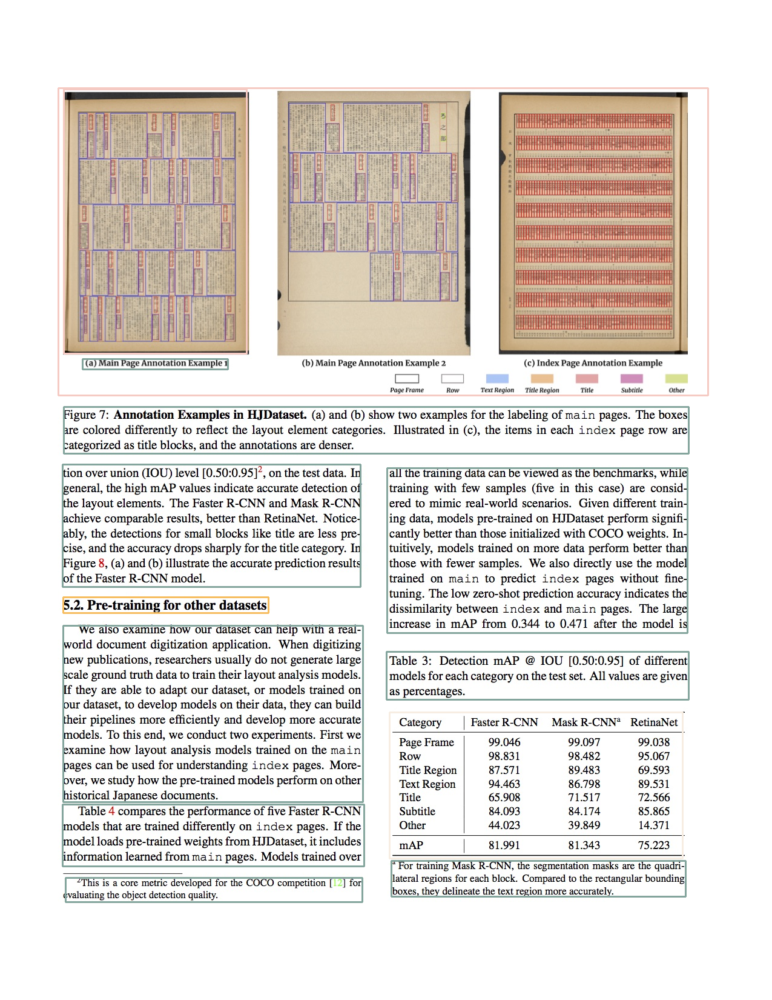

In [ ]:
import layoutparser as lp
model = lp.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',
                                 extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})
layout = model.detect(image) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
lp.draw_box(image, layout,box_width=3)

In [ ]:
text_blocks = lp.Layout([b for b in layout if b.type=="Title"])
text_blocks

Layout(_blocks=[TextBlock(block=Rectangle(x_1=104.61056518554688, y_1=985.7218627929688, x_2=443.9455261230469, y_2=1011.2669067382812), text=None, id=None, type=Title, parent=None, next=None, score=0.9874864816665649)], page_data={})

In [ ]:
figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])
figure_blocks 

Layout(_blocks=[TextBlock(block=Rectangle(x_1=96.58174896240234, y_1=145.0204315185547, x_2=1169.68408203125, y_2=652.1997680664062), text=None, id=None, type=Figure, parent=None, next=None, score=0.9950384497642517), TextBlock(block=Rectangle(x_1=105.54105377197266, y_1=147.27371215820312, x_2=407.6648864746094, y_2=583.7588500976562), text=None, id=None, type=Figure, parent=None, next=None, score=0.9606881737709045)], page_data={})

In [ ]:
text_blocks = lp.Layout([b for b in text_blocks \
                   if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

In [ ]:
h, w = image.shape[:2]

left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

left_blocks = text_blocks.filter_by(left_interval, center=True)
left_blocks.sort(key = lambda b:b.coordinates[1], inplace=True)

right_blocks = [b for b in text_blocks if b not in left_blocks]
right_blocks.sort(key = lambda b:b.coordinates[1])

# And finally combine the two list and add the index
# according to the order
text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

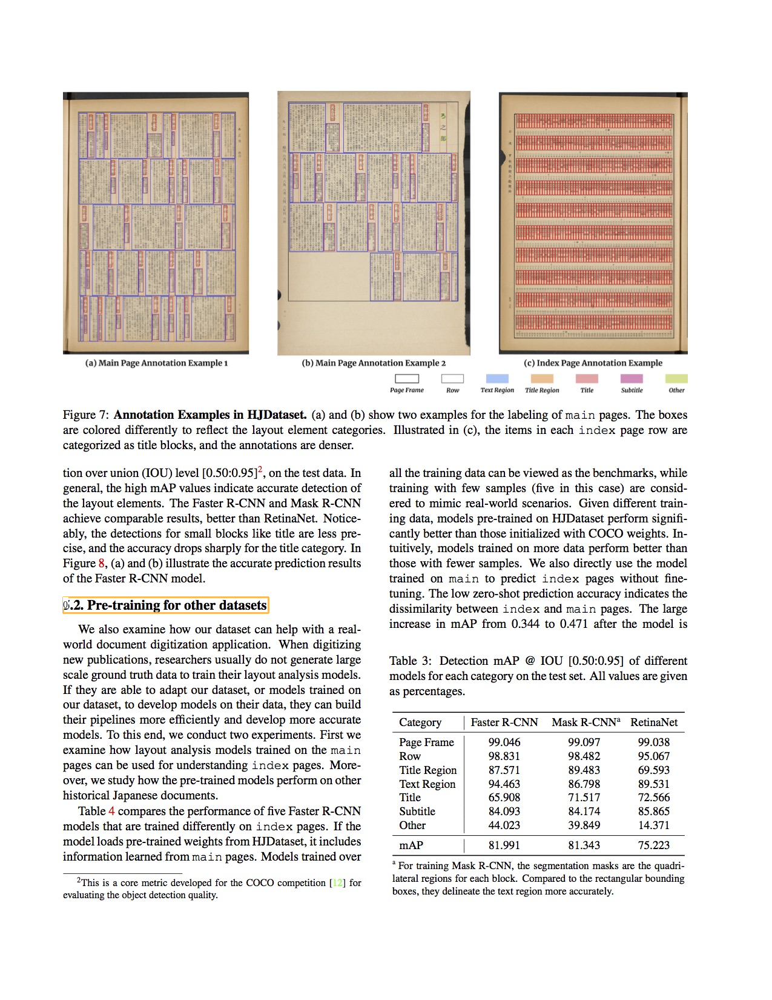

In [ ]:
lp.draw_box(image, text_blocks,
            box_width=3,
            show_element_id=True)

In [ ]:
image1 = cv2.imread("/image40.png")
image1 = image1[..., ::-1] 

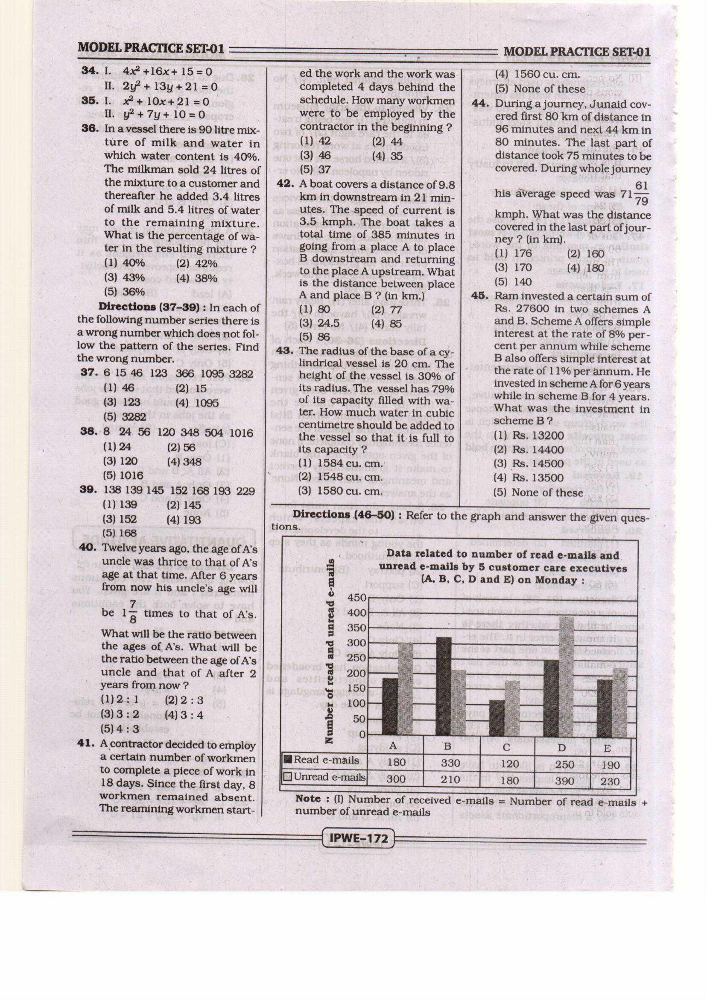

In [ ]:
model = lp.Detectron2LayoutModel('lp://PubLayNet/mask_rcnn_X_101_32x8d_FPN_3x/config',extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.65],
                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})
layout = model.detect(image1) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
lp.draw_box(image1, layout,)

config.yaml?dl=1: 8.19kB [00:01, 6.05kB/s]
model_final.pth?dl=1: 351MB [00:14, 24.8MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


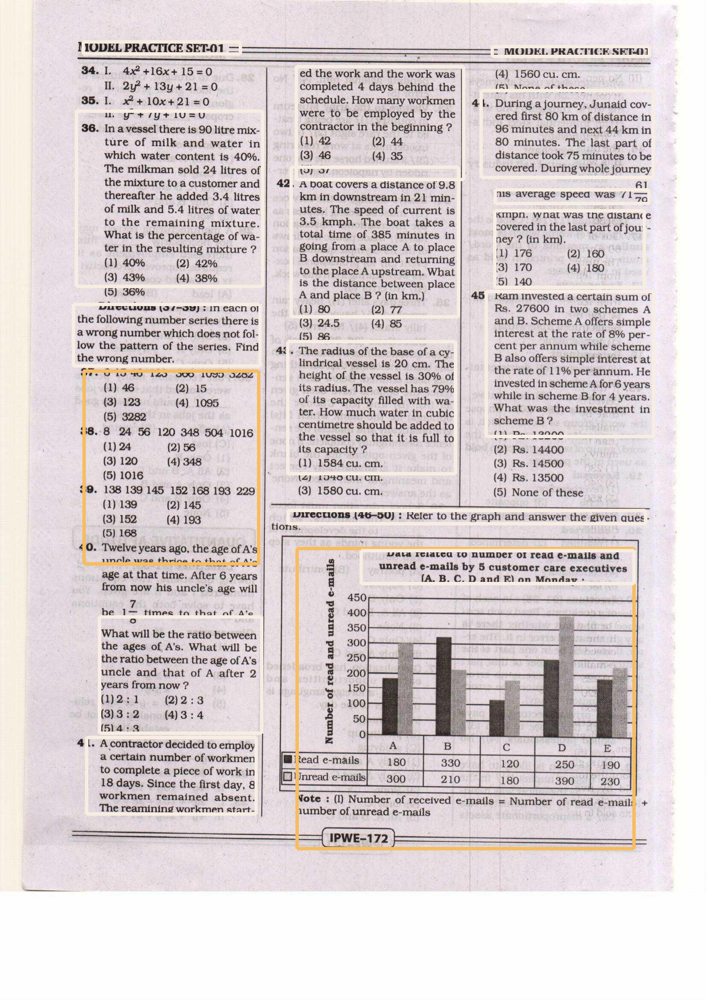

In [ ]:

model = lp.Detectron2LayoutModel('lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config',extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.65],
                                 label_map={1:"TextRegion", 2:"ImageRegion", 3:"TableRegion", 4:"MathsRegion", 5:"SeparatorRegion", 6:"OtherRegion"})
layout = model.detect(image1) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
lp.draw_box(image1, layout,)